## CZ3006 Lab 4 - Analyzing Network Traffic Log Data using Python

Conduct basic analysis of the given SFLow traffic data log and generate the following information:

* Top 5 talkers (Sending nodes)
* Top 5 listeners (Receiving nodes)
* Top 5 applications
* Traffic Intensity
* Proportion of TCP and UDP packets
* Top 5 communication pairs (optional)
* Visualizing the communication between different IP hosts (Optional)

By Lim Eng Keat Joshen (TS2), U1722911C

### Import libraries and load dataset

In [1]:
import pandas as pd
import requests
import math

n = 5
ip_api_url = 'http://ip-api.com/json'
dataset_url = '../SFlow_Data_lab4.csv'

traffic_data_cols = ['type', 'sf_agent_address', 'input_port', 'output_port', 'src_MAC', 'dst_MAC', 'ethernet_type',
'in_vlan', 'out_vlan', 'src_IP', 'dst_IP', 'IP_protocol', 'ip_tos', 'ip_ttl', 'src_port', 'dst_port',
'tcp_flags', 'packet_size', 'IP_size', 'sampling_rate']

In [2]:
traffic_df = pd.read_csv(
    dataset_url,
    index_col=False,
    names=traffic_data_cols
)

total_rows = traffic_df.shape[0]
print(f'Traffic Log has {total_rows} rows and {traffic_df.shape[1]} columns')
traffic_df.head(10)

Traffic Log has 69370 rows and 20 columns


,type,sf_agent_address,input_port,output_port,src_MAC,dst_MAC,ethernet_type,in_vlan,out_vlan,src_IP,dst_IP,IP_protocol,ip_tos,ip_ttl,src_port,dst_port,tcp_flags,packet_size,IP_size,sampling_rate
0,FLOW,aa.aa.aa.aa,137,200,d404ff55fd4d,80711fc76001,0x0800,919.0,280,130.246.176.22,140.115.32.81,6,0x00,50,51216.0,23505,0x10,1518,1500,2048
1,FLOW,aa.aa.aa.aa,129,193,609c9f851b00,0031466b23cf,0x0800,11.0,919,155.69.160.32,64.233.188.128,6,0x00,56,23159.0,80,0x10,74,52,2048
2,FLOW,aa.aa.aa.aa,137,200,d404ff55fd4d,80711fc76001,0x0800,919.0,280,130.246.176.53,140.115.32.83,6,0x00,50,50041.0,20739,0x10,1518,1500,2048
3,FLOW,aa.aa.aa.aa,129,135,609c9f851b00,002688cd5fc7,0x0800,11.0,919,155.69.160.32,54.169.174.79,17,0x00,120,54241.0,26510,0x10,116,94,2048
4,FLOW,aa.aa.aa.aa,130,199,00239cd087c1,544b8cf9a7df,0x0800,919.0,600,137.132.228.15,193.62.192.8,6,0x00,56,53923.0,34262,0x10,70,52,2048
5,FLOW,aa.aa.aa.aa,129,135,609c9f851b00,002688cd5fc7,0x0800,11.0,919,155.69.160.32,54.255.221.151,17,0x00,120,55069.0,26509,0x10,113,91,2048
6,FLOW,aa.aa.aa.aa,130,199,00239cd087c1,544b8cf9a7df,0x0800,919.0,600,137.132.250.8,193.62.193.9,6,0x00,62,27419.0,80,0x10,58,40,2048
7,FLOW,aa.aa.aa.aa,137,200,d404ff55fd4d,80711fc76001,0x0800,919.0,280,193.61.196.206,140.110.147.170,6,0x00,240,443.0,43545,0x18,1518,1500,2048
8,FLOW,aa.aa.aa.aa,200,3,80711fc76001,00235ed9b680,0x0800,280.0,32,137.189.133.62,123.136.64.7,6,0x00,58,6345.0,34921,0x10,1342,1320,2048
9,FLOW,aa.aa.aa.aa,199,130,544b8cf9a7df,00239cd087c1,0x0800,600.0,919,193.62.192.8,137.132.228.15,6,0x08,55,34262.0,53923,0x10,1442,1420,2048


### Top 5 Talkers

In [7]:
src_ip_count_map = dict(traffic_df.src_IP.value_counts())
top_talkers = list(src_ip_count_map.items())[:n]

headers = ['Organization', 'IP Address', '# Packet']

print(f'{headers[0]:50} {headers[1]:20} {headers[2]:8}')
print('-' * 80)

for talker in top_talkers:
    talker_ip, talker_count = talker
    res = requests.get(f'{ip_api_url}/{talker[0]}')
    org = res.json()['org'] if len(res.json()['org']) > 0 else res.json()['as']
    print(f'{org:50} {talker_ip:20} {talker_count:>8}')

Organization                                       IP Address           # Packet
--------------------------------------------------------------------------------
European Bioinformatics Institute                  193.62.192.8             3041
Nanyang Technological University                   155.69.160.32            2975
National Library of Medicine                       130.14.250.11            2604
Indian Institute of Technology                     14.139.196.58            2452
Tanet                                              140.112.8.139            2056


### Top 5 Listeners

In [6]:
dst_ip_count_map = dict(traffic_df.dst_IP.value_counts())
top_listeners = list(dst_ip_count_map.items())[:n]

headers = ['Organization', 'IP Address', '# Packet']

print(f'{headers[0]:50} {headers[1]:20} {headers[2]:8}')
print('-' * 80)

for listener in top_listeners:
    listener_ip, listener_count = listener
    res = requests.get(f'{ip_api_url}/{listener[0]}')
    org = res.json()['org'] if len(res.json()['org']) > 0 else res.json()['as']
    print(f'{org:50} {listener_ip:20} {listener_count:>8}')

Organization                                       IP Address           # Packet
--------------------------------------------------------------------------------
A*STAR                                             103.37.198.100           3841
National University of Singapore                   137.132.228.15           3715
Rpnet                                              202.21.159.244           2446
Pacific Northwest National Laboratory              192.101.107.153          2368
AS132423 Indian Institute of Technology Bombay     103.21.126.2             2056


### Transport Protocol (Proportion of TCP/UDP)

In [9]:
ip_protocol_map = {0: 'HOPOPT', 1: 'ICMP', 6: 'TCP', 17: 'UDP', 41: 'IPV6', 47: 'GRE', 50: 'ESP'}
ip_protocols = dict(traffic_df.IP_protocol.value_counts())
ip_protocols = list(ip_protocols.items())

headers = ['IP Protocol', 'Header Value', '# Packet', 'Percentage']
print(f'{headers[0]:15} {headers[1]:15} {headers[2]:12} {headers[3]:9}')
print('-' * 55)

for protocol in ip_protocols:
    protocol_id, count = protocol
    try:
        protocol_name = ip_protocol_map[protocol_id]
    except:
        protocol_name = 'Unknown'
    print(f'{protocol_name:15} {protocol_id:<15} {count:<12} {(count/total_rows) * 100:>9.2f}%')

IP Protocol     Header Value    # Packet     Percentage
-------------------------------------------------------
TCP             6               56064            80.82%
UDP             17              9462             13.64%
ESP             50              1698              2.45%
HOPOPT          0               1261              1.82%
GRE             47              657               0.95%
IPV6            41              104               0.15%
ICMP            1               74                0.11%
Unknown         381             45                0.06%
Unknown         58              4                 0.01%
Unknown         103             1                 0.00%


### Top 5 Application Protocols

In [16]:
# Well-known ports range from 0 through 1023.
# Registered ports are 1024 to 49151.
# Dynamic ports (also called private ports) are 49152 to 65535.

app_ports = dict(traffic_df.dst_port.value_counts())
app_ports = list(app_ports.items())[:5]

# These maps were retrieved via https://www.adminsub.net/tcp-udp-port-finder
# Just hardcoded them here to make the print logs nicer
app_port_map = {45512: 'Unassigned', 443: 'HTTPS', 80: 'HTTP', 52866: 'Dynamic and/or Private Ports', 56152: 'Dynamic and/or Private Ports'}

headers = ['Service Name', 'Port No.', '# Packet']
print(f'{headers[0]:40} {headers[1]:15} {headers[2]:12}')
print('-' * 65)

for port in app_ports:
    port_no, count = port
    try:
        service_name = app_port_map[port_no]
    except:
        service_name = 'Unknown'
    print(f'{service_name:40} {port_no:<15} {count:<12}')

Service Name                             Port No.        # Packet    
-----------------------------------------------------------------
HTTPS                                    443             13423       
HTTP                                     80              2647        
Dynamic and/or Private Ports             52866           2068        
Unassigned                               45512           1356        
Dynamic and/or Private Ports             56152           1341        


### Traffic Intensity

In [120]:
# Assuming packet_size is in bytes
total_traffic = sum(list(traffic_df.packet_size))
total_traffic_mb = total_traffic / math.pow(10, 9)

print(f'Total traffic from dataset: {total_traffic_mb:.2f} GB ({total_traffic} bytes)')

Total traffic from dataset: 37.28 GB (37283880304 bytes)


### Top 5 Communication Pairs

In [72]:
# Am conducting this analysis via source and destination IP addresses
communication_pairs = dict(traffic_df.groupby(['src_IP', 'dst_IP']).size().sort_values(ascending=False))
communication_pairs = list(communication_pairs.items())[:n]

headers = ['Source IP', 'Source Organization', 'Dest. IP', 'Dest. Organization', 'Count']
print(f'{headers[0]:14} {headers[1]:33} {headers[2]:15} {headers[3]:46} {headers[4]:5}')
print('-' * 117)

for pair in communication_pairs:
    src_dst_ip, count = pair
    src_ip, dst_ip = src_dst_ip
    
    res = requests.get(f'{ip_api_url}/{src_ip}')
    src_org = res.json()['org'] if len(res.json()['org']) > 0 else res.json()['as']
    
    res = requests.get(f'{ip_api_url}/{dst_ip}')
    dst_org = res.json()['org'] if len(res.json()['org']) > 0 else res.json()['as']
    
#     print(src_org, dst_org)
    
    print(f'{src_ip:14} {src_org:33} {dst_ip:15} {dst_org:46} {count:<5}')

Source IP      Source Organization               Dest. IP        Dest. Organization                             Count
---------------------------------------------------------------------------------------------------------------------
193.62.192.8   European Bioinformatics Institute 137.132.228.15  National University of Singapore               3041 
130.14.250.11  National Library of Medicine      103.37.198.100  A*STAR                                         2599 
14.139.196.58  Indian Institute of Technology    192.101.107.153 Pacific Northwest National Laboratory          2368 
140.112.8.139  Tanet                             103.21.126.2    AS132423 Indian Institute of Technology Bombay 2056 
137.132.228.15 National University of Singapore  193.62.192.8    European Bioinformatics Institute              1910 


### Visualizing Network Communication between IP Hosts

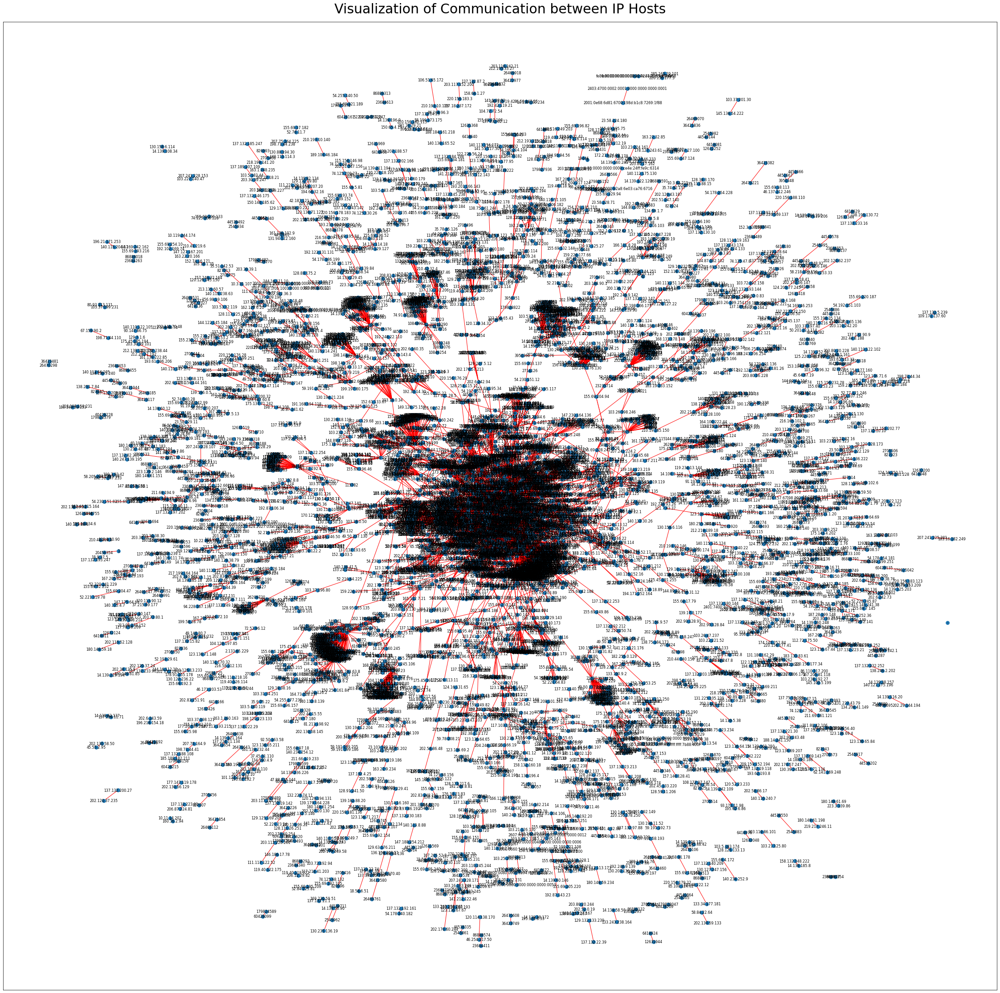

In [77]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

communication_pairs = dict(traffic_df.groupby(['src_IP', 'dst_IP']).size().sort_values(ascending=False))
communication_pairs = list(communication_pairs.items())
communication_pairs = [x[0] for x in communication_pairs]

G = nx.Graph(communication_pairs)

fig, ax = plt.subplots(1, 1, figsize=(40, 40));
pos = nx.spring_layout(G, k=1/np.sqrt(len(G.nodes())), iterations=20)

plt.title('Visualization of Communication between IP Hosts', fontsize=30, pad=20)
nx.draw_networkx(G, pos=pos, node_size=60, font_size=8, edge_color='red')
plt.savefig("../communication_visualization.png", format="PNG")

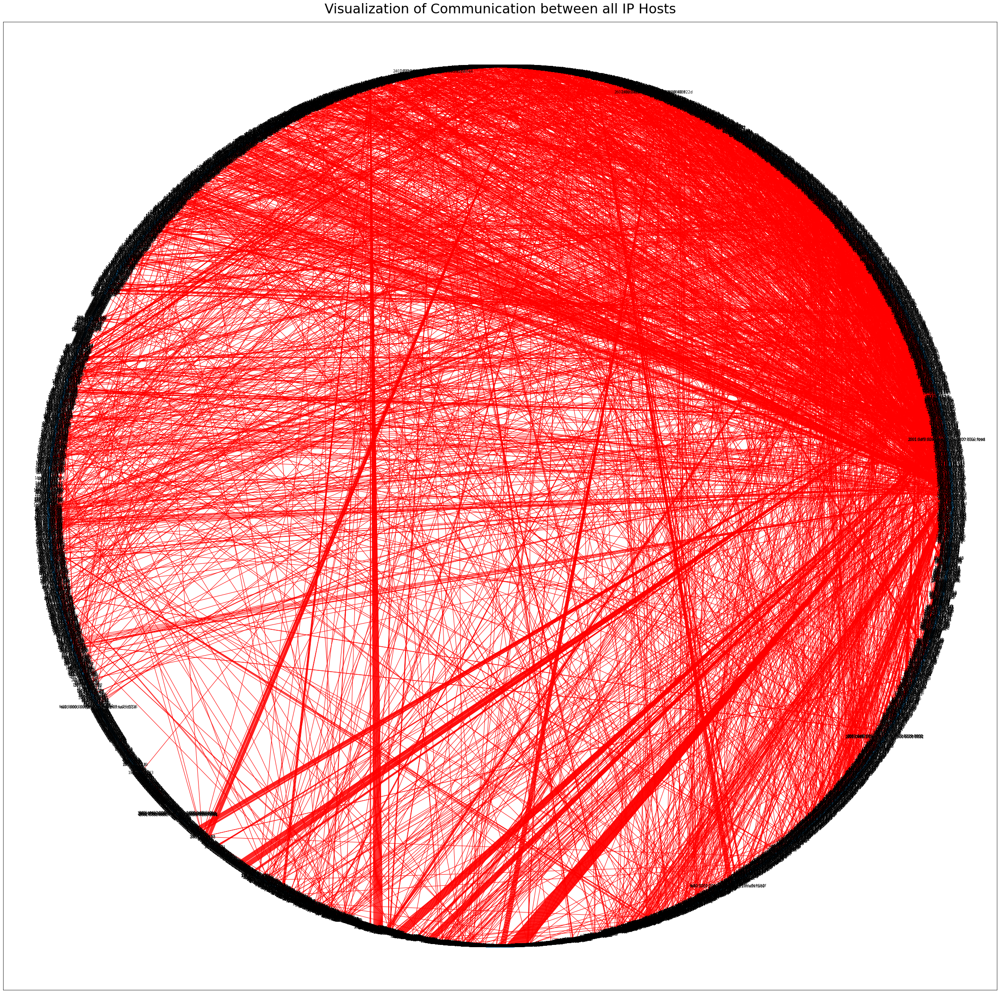

In [117]:
G = nx.Graph(communication_pairs)

fig, ax = plt.subplots(1, 1, figsize=(40, 40));
pos = nx.circular_layout(G)

plt.title('Visualization of Communication between all IP Hosts', fontsize=30, pad=20)
nx.draw_networkx(G, pos=pos, node_size=30, font_size=8, edge_color='red', with_labels=True)

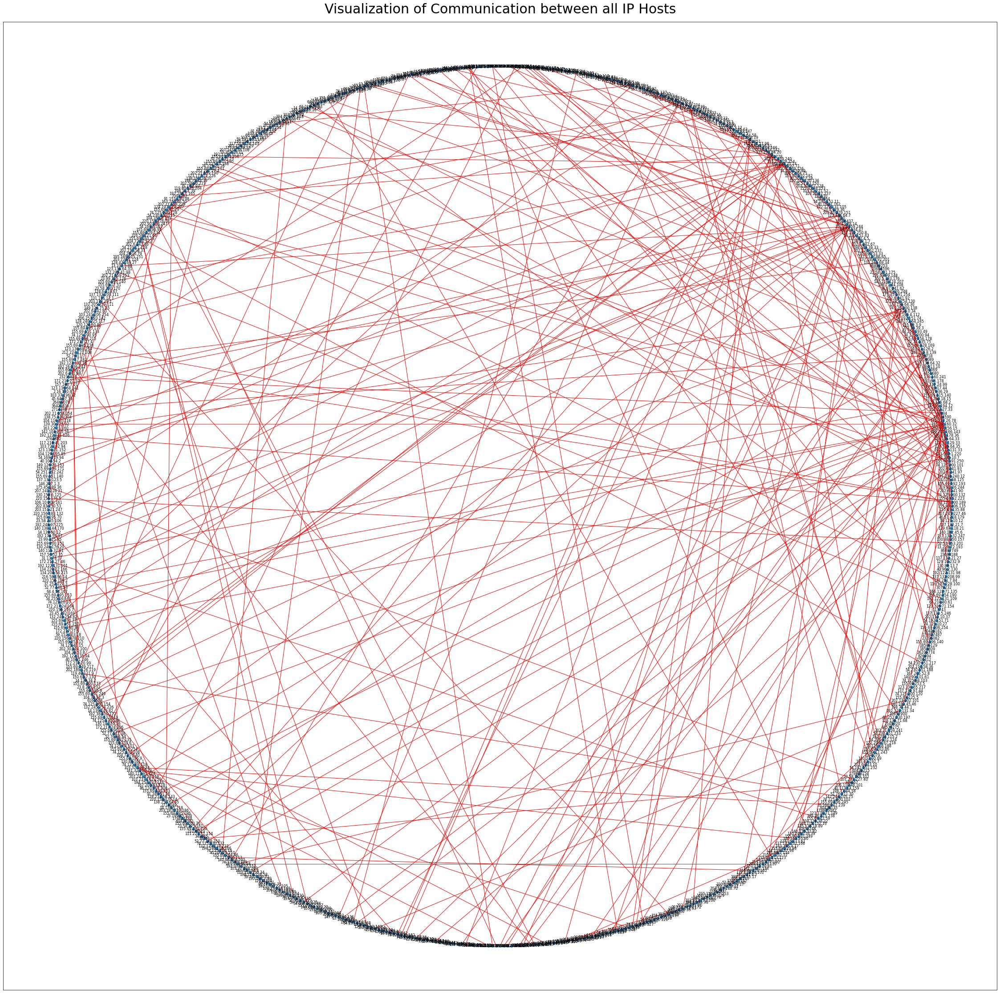

In [118]:
from random import sample

G = nx.Graph(sample(communication_pairs, 500))

fig, ax = plt.subplots(1, 1, figsize=(40, 40));
pos = nx.circular_layout(G)

plt.title('Visualization of Communication between all IP Hosts', fontsize=30, pad=20)
nx.draw_networkx(G, pos=pos, node_size=30, font_size=8, edge_color='red', with_labels=True)